# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:170%;text-align:center;border-radius:10px 10px;">Marston's 'Order at Table' Webscrape & Analysis</p>


   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:white;font-family:newtimeroman;color:#682F2F;font-size:180%;text-align:center;border-radius:10px 10px;">Stonegate Interview Assessment</p> 
   

<div>
<center><img src="https://ichef.bbci.co.uk/news/976/cpsprodpb/DA7C/production/_116723955_gettyimages-1287105239.jpg" width="700"/></center>
</div>

<b>Part 1</b> - Collect the data<br>
Create a dataset of all of Marston’s (online) pubs & prices by scraping https://order.marstons.co.uk/. Capture pub name, location, menus, prices and anything else that may be useful. Feel free to combine this data with any other datasets that you feel will be useful.

<b>Part 2</b> - Analyse the data<br>
Analyse and visualise the dataset. We are particularly interested in any patterns found in drinks pricing but would also appreciate any non-drink related observations if relevant. 

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">TABLE OF CONTENTS</p>   
    
* [1. ENVIRONMENT SETUP](#1)

* [2. DATA SCRAPING](#2)   

* [3. PRE-PROCESSING AND TRANSFORMATIONS](#3) 

* [4. EXPLORATORY DATA ANALYSIS](#4) 



<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:200%;text-align:center;border-radius:10px 10px;">ENVIRONMENT SETUP</p>

In [498]:
# -----Imports & Warnings
# Selenium Webscrape
from selenium import webdriver
from selenium.webdriver.common.keys import Keys
from selenium.common.exceptions import NoSuchElementException
from selenium.webdriver.common.action_chains import ActionChains

# Data Science Packages
import time, folium, re, sklearn, scipy, math, matplotlib, numpy as np, pandas as pd, matplotlib.pyplot as plt, pgeocode
from IPython.display import Image

# Disable Warnings
import warnings
warnings.filterwarnings('ignore')


# -----Display Formatting
# Default vis tick sizes
matplotlib.rc('xtick', labelsize=10) 
matplotlib.rc('ytick', labelsize=15) 

# Set Colour Palettes
palette = ['#330000','#D09683']
palette2 = ['#330000','#44110E', '#5F2B25', '#6F3A32','#D09683']
pie1 = ['#330000', '#895348','#D09683']
regioncolour = ['#6e8948', '#837775','#6e8948', '#487e89','#894858','#894858',
                '#487e89','#894873','#de8675', '#894858','#487e89' ]
locationcolour = ['#6e8948', '#894858',  '#487e89', '#837775', '#894873', '#de8675']


# Text print format
class color:
    PURPLE = '\033[95m'
    CYAN = '\033[96m'
    DARKCYAN = '\033[36m'
    BLUE = '\033[94m'
    GREEN = '\033[92m'
    YELLOW = '\033[93m'
    RED = '\033[91m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'
    END = '\033[0m'
    
    

# -----Function Definitions

# Scrape Menu and Pricing information
def scrape_subpage(link, pub, driver):
    driver.get(link)
    driver.maximize_window()
    
    # Ensure webpage has loaded
    time.sleep(10)
    
    df2 = pd.DataFrame(columns=['pubName','category', 'subCategory', 'subSubCategory', 'productName', 'productPrice'])

    try:
        # Clear order button
        order = driver.find_element_by_class_name('service-select__option')
        order.click()
        time.sleep(3)
        
        # Select table number
        tableNumber = driver.find_element_by_class_name('input-form__input')
        tableNumber.send_keys('1')
        time.sleep(3)
        confirmTblNo = driver.find_element_by_class_name('input-form__button')
        confirmTblNo.click()
        time.sleep(3)
        
    except NoSuchElementException:
        # Menu data not available, so close driver
        driver.close()
        return

    # Select 'no' to allergy question
    try:
        for i in driver.find_elements_by_class_name('_base-button_button_1_hTJ'):
            if (i.find_element_by_xpath('.//span').text == "No"):
                i.click()
                time.sleep(3)
                
        # Clear cookie banner
        driver.find_element_by_class_name('cookie-banner__dismiss-btn').click()
        time.sleep(3)
    except NoSuchElementException:
        pass
    
   
    
    
    # Categories
    for category in driver.find_elements_by_class_name('menu__category'):
        newCat = category.find_element_by_class_name('panel__text').text
        
        if (category.find_elements_by_class_name('menu__sub-category')):
        
            # Sub-categories
            for subcategory in category.find_elements_by_class_name('menu__sub-category'):
                newSubCat = subcategory.find_element_by_class_name('panel__text').text
            
                if (subcategory.find_elements_by_class_name('menu__sub-sub-category')):
                
                    # Sub-sub-categories
                    for subSubcategory in subcategory.find_elements_by_class_name('menu__sub-sub-category'):
                        newSubSubCat = subSubcategory.find_element_by_class_name('panel__text').text
                
                        # Products in sub-sub
                        for product in subSubcategory.find_elements_by_class_name('drawer__item'):
                            productName = product.find_element_by_class_name('details__name').text
                            try:
                                productPrice = product.find_element_by_class_name('details__price').text
                            except NoSuchElementException:
                                productPrice = '£0.00'
                    
                         
                    
                            tempDF = {'pubName':pub, 'category':newCat, 'subCategory':newSubCat, 'subSubCategory':newSubSubCat, 'productName':productName, 'productPrice':productPrice}
                            df2.loc[len(df2)] = tempDF                   
                else:                   
                    # Products in sub    
                    for product in subcategory.find_elements_by_class_name('drawer__item'):
                        productName = product.find_element_by_class_name('details__name').text
                        try:
                            productPrice = product.find_element_by_class_name('details__price').text
                        except NoSuchElementException:
                            productPrice = '£0.00'
                        tempDF = {'pubName':pub, 'category':newCat, 'subCategory':newSubCat, 'subSubCategory':"None", 'productName':productName, 'productPrice':productPrice}
                        df2.loc[len(df2)] = tempDF
                
                     
        
        else:
            # Products in cat
            for product in category.find_elements_by_class_name('drawer__item'):
                productName = product.find_element_by_class_name('details__name').text
                try:
                    productPrice = product.find_element_by_class_name('details__price').text
                except NoSuchElementException:
                    productPrice = '£0.00'
            
                tempDF = {'pubName':pub, 'category':newCat, 'subCategory':"None", 'subSubCategory':"None", 'productName':productName, 'productPrice':productPrice}
                df2.loc[len(df2)] = tempDF           
                     
            
  
    driver.close()
    return (df2)


# Improve hierarchical grouping
def replace_all(position, dic):
    for i, j in dic.items():
        fullDataframe[position] = fullDataframe[position].replace(i, j)

# Region colour selection
def colour_select1(region):
    if region in ('East Midlands', 'North West', 'West Midlands', 'Yorkshire and The Humber'):
        return palette[0]
    else:
        return palette[1]

def colour_select2(region):
    if region == 'Wales':
        return palette[0]
    else:
        return palette[1]    

def colour_select3(region):
    if region == 'Scotland':
        return palette[0]
    else:
        return palette[1]
    
    
# Folium Map Definition
def createMap(myDf, mapLat, mapLon, mygroup, dataLat, dataLon, fillColour, radius, zoom, title_html, colour_select):
    newMap = folium.Map(location=[mapLat, mapLon], tiles="OpenStreetMap", zoom_start=zoom)
    tempDF = myDf.groupby(mygroup, as_index=False).first()
    tempDF2 = pd.DataFrame(tempDF)
    newMap.get_root().html.add_child(folium.Element(title_html))
    [folium.CircleMarker([row[dataLat], row[dataLon]],  fill_opacity=1,
    opacity=1,fill=True, fill_color=colour_select(row[fillColour]), radius=radius, weight=1, color="black",
                ).add_to(newMap) 
    for index, row in tempDF2.iterrows()]
    
    display(newMap)

    
# Pie-Chart Value Labels
def func(pct, allvalues):
    absolute = int(pct / 100.*np.sum(allvalues))
    return "{:.1f}%".format(pct)


# Create Pivot Tables
def createPivot(myDF, values, index, aggfunc, sort):
    df_pivot = pd.pivot_table(myDF, values=values, index=index, aggfunc=aggfunc)
    df_pivot = df_pivot.reindex(df_pivot[values].sort_values(ascending=sort).index)
    return df_pivot


def displayPivot(label, df, index):
    newPiv = createPivot(df, 'productName', index,  pd.Series.nunique, True)
    print(color.RED + color.BOLD +label+color.END)
    print(newPiv)
        

# Create Alternative Pivot Tables
def createPivot2(myDF, values, index, aggfunc, sort):
    df_pivot = pd.pivot_table(myDF, values=values, index=index, aggfunc=aggfunc)
    return df_pivot

# Create H-Bar
def createHBar(axis, y, x, colour, xlimStart, xlimEnd, title, fontsize, otherChart):
    axis.barh(y, x, color=colour)
    axis.set(xlim=(xlimStart, xlimEnd), ylabel="", xlabel="")
    axis.set_title(title,fontsize= fontsize)
    axis.spines['top'].set_visible(False)
    axis.spines['right'].set_visible(False)
    axis.spines['bottom'].set_visible(False)
    axis.spines['left'].set_visible(False)
    
    if otherChart==0:   
        for p in axis.patches:
            width = p.get_width()    # get bar length
            axis.text(width + 1,       # set the text at 1 unit right of the bar
                p.get_y() + p.get_height() / 2, # get Y coordinate + X coordinate / 2
                '{:1.0f}'.format(width), # set variable to display, 2 decimals
                ha = 'left',   # horizontal alignment
                va = 'center', fontsize=15)  # vertical alignment
    elif otherChart==1:
        # .patches is everything inside of the chart
        for rect in axis.patches:
            # Find where everything is located
            height = rect.get_height()
            width = rect.get_width()
            x = rect.get_x()
            y = rect.get_y()

            # The height of the bar is the data value and can be used as the label
            label_text = f'£{width:1.2f}'  # f'{width:.2f}' to format decimal values

            # ax.text(x, y, text)
            label_x = x + width / 2
            label_y = y + height / 2

            # only plot labels greater than given width
            if width > 0:
                axis.text(label_x, label_y, label_text, ha='center', va='center', fontsize=11)

# Create Pie Chart        
def createPie(axis, group, colour, title, fontsize, textcolour, autotextcolour, colorselect):
    # Country Pie-Chart    
    patches, texts, autotexts  = axis.pie(group, 
        labels=group.index, 
        autopct=lambda pct: func(pct, group),
        colors=colorselect,
        textprops={'color':colour}
       )
    axis.set_title(title, fontsize= fontsize)
    [text.set_color(textcolour) for text in texts]
    [autotext.set_color(autotextcolour) for autotext in autotexts]



def createHbar2(axis, myDF, stacked, colour, title, xlimstart, xlimstop, legendtitle):
    myDF.plot(kind='barh', ax=axis, stacked=stacked, color=colour)   
    axis.set( ylabel="", title=title, xlabel="", xlim=(xlimstart,xlimstop))
    axis.spines['top'].set_visible(False)
    axis.spines['right'].set_visible(False)
    axis.spines['bottom'].set_visible(False)
    axis.spines['left'].set_visible(False)
    axis.legend(title=legendtitle)


    # .patches is everything inside of the chart
    for rect in axis.patches:
        # Find where everything is located
        height = rect.get_height()
        width = rect.get_width()
        x = rect.get_x()
        y = rect.get_y()

        # The height of the bar is the data value and can be used as the label
        label_text = f'£{width:1.2f}'  # f'{width:.2f}' to format decimal values

        # ax.text(x, y, text)
        label_x = x + width / 2
        label_y = y + height / 2

        # only plot labels greater than given width
        if width > 0:
            axis.text(label_x, label_y, label_text, ha='center', va='center', fontsize=11)

# Premium Products Output            
def outputPP(data):
    print(color.RED + color.BOLD +"Top 10 Most Expensive (on average)"+color.END)
    print(data.head(10))

    print('-'*100)

    print(color.RED + color.BOLD +"Top 10 Least Expensive (on average)"+color.END)
    print(data.tail(10))            

print('\n'*4)    

<a id="2"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:200%;text-align:center;border-radius:10px 10px;">DATA SCRAPING</p>
Gather pub name, location, and web-link from the system homepage, and then scrape corresponding menu data.


In [499]:
# Set-up Driver
driver = webdriver.Chrome('A:/tomst/Documents/chromedriver-win64/chromedriver-win64/chromedriver')
driver.get('https://order.marstons.co.uk/')
time.sleep(5)

In [500]:
# Pub Information 
df = pd.DataFrame(columns=['PubName', 'PubLocation', 'WebLink'])
df2 = pd.DataFrame(columns=['pubName','category', 'subCategory', 'subSubCategory', 'productName', 'productPrice'])


pub_name = []
pub_location = []
web_link = []

for p in driver.find_elements_by_class_name('venue-card'):
    pubN = p.find_element_by_xpath('.//section[@class="venue-card__body"]/div[@class="body__main"]/h3[@class="body__heading"]').text
    pub_name.append(pubN)
    print(pubN)
    
    try:
        pub_location.append(p.find_element_by_xpath('.//section[@class="venue-card__body"]/div[@class="body__main"]/p[@class="body__address"]').text)
    except NoSuchElementException:
        pub_location.append("No Location")
          
    
    web_link.append(p.get_attribute('href'))
    
    # Uncomment below to run scraper on menu data
    #dataframe = scrape_subpage(p.get_attribute('href'), pubN, driver)
    #df2 = df2.append(dataframe)
 

    
df['PubName'] = pub_name 
df['PubLocation'] = pub_location
df['WebLink'] = web_link

Blue Jay Derby
Viking's Landing Liverpool
Horn & Trumpet Stoke-on-Trent
Elms Lutterworth
Skymaster Warrington
Blaina Wharf Newport
Cherry Laurel Bridgend
Y Cerrig Glas Pembroke Dock
Willow Tree Brynmawr
Clock Works Ystradgynlais
Ten Lock Flight Runcorn
Cotton Mill Newcastle-under-Lyme
Peacock Birchwood
Mulberry Leaves Leek
Inkwell at Lichfield
The Boundary On The Green
Oyster Bed Whitstable
Canterbury Bell Thanet
Fields at Aylesford
Saxon King Southend-on-Sea
Star at Sidcup Place
Sarsen Stones Farnborough
Coaching Halt Crawley
Flying Shuttle Haverhill
Gunpowder Mill Faversham
Winter Green Rotherham
Alders Ollerton
Lockkeeper Worksop
Tawny Owl Newark
Golden Eagle Mansfield
Copper Beech Norwich
Grayling Great Yarmouth
Greenstone Dereham
Tulip Queen Spalding
Cobblestones March
Running Horse Fakenham
Sugar Mill Bourne
Apple Cart Peterborough
Spring Tide Lowestoft
Honeystone Hunstanton
Spread Eagle Corby
Swan & Cygnet Wakefield
House Martin Doncaster
Red Sails Hull
Kings Chamber Thorne
Iron

Swan
Green Lodge Hotel
Dog
Bluebell Inn
Crown Inn
Ferrers Arms
Green Dragon
Bridge Inn
Clock Warehouse
Wheatsheaf
Altisidora
Boat House
Wheatsheaf
Acorn Nuneaton
Childwall Abbey Liverpool
Red Lion Parbold
Broughton Arms Rode Heath
Dog & Partridge Failsworth
Gate Osbaston
Kings Head Buxton
Crown Bournemouth
Famous Old Spa Weymouth
Lion & Snake Lincoln
Duke of Cumberland Ferriby
Cock Norwich
Butlers High Wycombe
Queens Hotel Hull
Queens Head Hedon
Model T Darlington
Ling Forest Mansfield
Red Lion Droitwich
Gough Arms
Red Lion Inn Mold
White Hart Ashby
Swan Mansfield
Nags Head Wrexham
Waterloo Cross
Fiveways
Magna Carta
Twelve Knights Neath
Three Arches
Crwys Hotel
Greenhouse
Darran Risca
Fox & Hounds Hotel
The Pump House
Black Boy
Star Hotel
Old Inn
Birchgrove Hotel
Cwm Talwg Public House
Lamb & Flag
Pear Tree
Fox & Hounds Hotel
Hanbury Ale House
Maltsters Arms Hotel
Tynant Inn
Pheasant
Duke Of Wellington Hotel
Rose & Crown Porthcawl
Duke Of Wellington
Plough
Tafarn Tanerdy
Coopers Carve

<a id="3"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:200%;text-align:center;border-radius:10px 10px;">PRE-PROCESSING AND TRANSFORMATIONS</p>

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Imputing locations for missing records</p>

In [501]:
# Locating pubs with no location
df.loc[df['PubLocation'] == "No Location"]

,PubName,PubLocation,WebLink
0,Blue Jay Derby,No Location,https://order.marstons.co.uk/bluejay
245,Milestone Hinkley,No Location,https://order.marstons.co.uk/milestone
328,Claregate Tettenhall,No Location,https://order.marstons.co.uk/claregate


Look-up addresses from Google search<br>
<span style="color:#895348; font-weight:bold;">- Blue Jay: Derby, DE21 7HX</span><br>
<span style="color:#895348; font-weight:bold;">- Milestone: Hinckley, LE10 0GL</span><br>
<span style="color:#895348; font-weight:bold;">- Claregate: Wolverhampton, WV6 9ED</span>

    
    

In [502]:
df.at[0, 'PubLocation'] = "Derby, DE21 7HX"
df.at[244, 'PubLocation'] = "Hinckley, LE10 0GL"
df.at[327, 'PubLocation'] = "Wolverhampton, WV6 9ED"

df.head()

,PubName,PubLocation,WebLink
0,Blue Jay Derby,"Derby, DE21 7HX",https://order.marstons.co.uk/bluejay
1,Viking's Landing Liverpool,"Liverpool, L11 2BD",https://order.marstons.co.uk/vikingslanding
2,Horn & Trumpet Stoke-on-Trent,"Stoke-On-Trent, ST1 6EJ",https://order.marstons.co.uk/horntrumpet
3,Elms Lutterworth,"Lutterworth, LE17 4HB",https://order.marstons.co.uk/elms
4,Skymaster Warrington,"Warrington, WA5 7YA",https://order.marstons.co.uk/skymasterwarrington


   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Join menu and pub datasets to acquire postcode</p>


In [503]:
df2 = pd.read_excel("MenuAndPriceDataV3.xlsx")
df2 = df2.rename(columns={'pubName': 'PubName'})

# Join data. Remove URL column as Excel limits # allowed in worksheet
fullDataframe = df2.merge(df, on='PubName', how='left')
fullDataframe = fullDataframe.drop('WebLink', axis=1)

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Save Pub, Menu and Pricing Data to xlsx</p>

In [504]:
# Save fullDataframe - uncomment when needed
# fullDataframe.to_excel("MarstonsPubMenuPricing-V1.xlsx")

# Get fullDataframe
fullDataframe = pd.read_excel("MarstonsPubMenuPricing-V1.xlsx")

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Seperating postcode</p>

Postcodes will be used to obtain regional and lat/lon data points.

In [505]:
# Seperate last 8 characters from location
fullDataframe['Postcode'] = fullDataframe['PubLocation'].str.slice(start=-8)

# Use RegEx to format postcodes - removing prefixed spaces and commas
for index, row in fullDataframe.iterrows():
    pc = row['Postcode']
    result = re.search("^, ",pc)
    if result:
        fullDataframe.at[index,'Postcode'] = pc[-6:]
    
    
for index, row in fullDataframe.iterrows():
    lStrip = row['Postcode'].lstrip()
    fullDataframe.at[index,'Postcode']=lStrip

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Filtering out food items (focus is on beverages only)</p>

In [506]:
beverageCats = ['Hot Beverages', 'Soft Drinks', 'Bottles', 'Draught', 'Spirits', 'Wine', 
                'Cocktails', 'Hot Drinks', 'Bottled Drinks'] 
  
# Selecting rows based on condition 
fullDataframe = fullDataframe[fullDataframe['category'].isin(beverageCats)] 

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Re-mapping levels of the product hierarchy</p>

In effort to obtain consistent hierarchy and product names across pub menus.

In [507]:
# -----Code sub-optimal - needs refactoring using RegEx

# New column
fullDataframe['WineMeasure'] = ''
    

# Category re-mapping    
catDict = {
    "Hot Drinks": "Hot Beverages",
    "Bottled Drinks": "Bottles"
}


# Sub-category re-mapping
subcatDict = {
    'Ale': 'Ales',
    'Bottled Ale': 'Ales',
    'Bottled Ales': 'Ales',
    'Bottles Cider & Other': 'Cider',
    'Bottles Lager': 'Beers',
    'Bottles Low & Non Alcohol': 'Low & No Alcohol',
    'Bottle Spirits': 'Spirits',
    'Bottled Spirits': 'Spirits',
    'Cider & Other': 'Cider',
    'Low & No-Alcohol': 'Low & No Alcohol',
    'Low and No-Alcohol': 'Low & No Alcohol',
    'Celebrate with Cocktails': 'Cocktails',
    'Celebrate with Pitchers': 'Pitchers',
    'Draught Ale': 'Ales',
    'Draught Cider': 'Cider',
    'Draught Lager': 'Beers',
    'Lager': 'Beers',
    'Draught Stout': 'Stout',
    'Spritz & Fizz': 'Spritz',
    'J20 & Juice': 'Juices',
    'Kids Drinks': 'Kids',
    'Kids Soft Drinks': 'Kids',
    'Fortified Spirits': 'Fortified',
    'Liqueurs & Other': 'Liqueurs & Shots',
    'Shots and Bombs': 'Shots & Bombs',
    'Red': 'Red Wine',
    'Rose': 'Rose Wine',
    'Sparkling': 'Sparkling Wine',
    'White': 'White Wine',
    'By the Bottle': 'Wine by the Bottle',
    'Bottled Mixers': 'Bottles & Cans',
    'Mocktails' : 'No Alcohol'
}


# Sub-sub-category re-mapping
subSubcatDict = {
    'Ale Half': 'Half',
    'Ale Half Shandy': 'Half Shandy',
    'Ale Half with a Dash': 'Half Dash',
    'Ale Half with Cordial': 'Half Cordial',
    'Ale Pint': 'Pint',
    'Ale Pint Shandy': 'Pint Shandy',
    'Ale Pint with a Dash': 'Pint Dash',
    'Ale Pint with Cordial': 'Pint Cordial',
    'Cider Half': 'Half',
    'Cider Half Shandy': 'Half Shandy',
    'Cider Half with a Dash': 'Half Dash',
    'Cider Half with Cordial': 'Half Cordial',
    'Cider Pint': 'Pint',
    'Cider Pint Cordial': 'Pint Cordial',
    'Cider Pint Shandy': 'Pint Shandy',
    'Cider Pint with a Dash': 'Pint Dash',
    'Lager Half': 'Half',
    'Lager Half Shandy': 'Half Shandy',
    'Lager Half with a Dash': 'Half Dash',
    'Lager Half with Cordial': 'Half Cordial',
    'Lager Pint': 'Pint',
    'Lager Pint with Cordial': 'Pint Cordial',
    'Lager Pint Shandy': 'Pint Shandy',
    'Lager Pint with Dash': 'Pint Dash',
    'Stout Half': 'Half',
    'Stout Half Shandy': 'Half Shandy',
    'Stout Half with a Dash': 'Half Dash',
    'Stout Half with Cordial': 'Half Cordial',
    'Stout Pint': 'Pint',
    'Stout Pint with Cordial': 'Pint Cordial',
    'Stout Pint Shandy': 'Pint Shandy',
    'Stout Pint with a Dash': 'Pint Dash',
    'Wine by the Bottle Red': 'Red',
    'Wine by the Bottle Rose': 'Rose',
    'Wine by the Bottle Sparkling': 'Sparkling',
    'Wine by the Bottle White': 'White',
    'Wine by the Glass Red': 'Red',
    'Wine by the Glass Rose': 'Rose',
    'Wine by the Glass White': 'White',
}


# Product re-mapping    
prodDict = {
    "Cappucino": "Cappuccino"
    
}


replace_all('category', catDict)
replace_all('subCategory', subcatDict)
replace_all('subSubCategory', subSubcatDict)
replace_all('productName', prodDict)



# Re-categorise wine into correct hierarchy
redWineBottle = ('Alta Vista Vive Classic Malbec', 
                 'Carta 23 Chilean Merlot', 
                 'Cotes du Rhone Victor Berard', 
                 'Gran Astro Tinto',
                 'Hardys Shiraz',
                 'Ondas Pinot Noir Reserva',
                 'Rioja Crianza Bodegas Medievo',
                 'Waipara Hills Pinot Noir',
                 'Franschhoek Merlot',
                 'Marques Crianza Rioja',
                 'Wise Wolf Cabernet Sauvignon 750ml'                
                )

redWineGlass = ('Alta Vista Vive Classic Malbec 125ml',
                'Alta Vista Vive Classic Malbec 175ml',
                'Alta Vista Vive Classic Malbec 250ml',
                'Beefsteak Club Malbec 187ml',
                'Carta 23 Chilean Merlot 125ml',
                'Carta 23 Chilean Merlot 175ml',
                'Carta 23 Chilean Merlot 250ml',
                'Gran Astro Tinto 125ml',
                'Gran Astro Tinto 175ml',
                'Gran Astro Tinto 250ml',
                'Invenio Shiraz 187ml',
                'Jack Rabbit Merlot 187ml 187ml',
                'Franschhoek Merlot 125ml',
                'Franschhoek Merlot 175ml',
                'Franschhoek Merlot 250ml',
                'Hardys Shiraz 125ml',
                'Hardys Shiraz 175ml',
                'Hardys Shiraz 250ml',
                'Marques Crianza Rioja 125ml',
                'Marques Crianza Rioja 175ml',
                'Marques Crianza Rioja 250ml',
                'Wise Wolf Cabernet Sauvignon 125ml',
                'Wise Wolf Cabernet Sauvignon 175ml',
                'Wise Wolf Cabernet Sauvignon 250ml',
                'Ondas Pinot Noir Reserva 125ml',
                'Ondas Pinot Noir Reserva 175ml',
                'Ondas Pinot Noir Reserva 250ml'
               )

roseWineBottle = ('Arietta Pinot Grigio Blush',
                  'Canto Regio Rosado',
                  'Hardys Rose',
                  'Sunset Heights Zinfandel Blush',
                  'Burlesque White Zinfandel Rose',
                  'Lyric Pinot Grigio Blush'          
                 )

roseWineGlass = ( 'Arietta Pinot Grigio Blush 125ml',
                  'Arietta Pinot Grigio Blush 175ml',
                  'Arietta Pinot Grigio Blush 250ml',
                  'Canto Regio Rosado 125ml',
                  'Canto Regio Rosado 175ml',
                  'Canto Regio Rosado 250ml',
                  'Jack Rabbit White Zinfandel 187ml 187ml',
                  'Hardys Rose 175ml',
                  'Hardys Rose 250ml',
                  'Sunset Heights Zinfandel Blush 125ml',
                  'Sunset Heights Zinfandel Blush 175ml',
                  'Sunset Heights Zinfandel Blush 250ml',
                  'Burlesque White Zinfandel Rose 125ml',
                  'Burlesque White Zinfandel Rose 175ml',
                  'Burlesque White Zinfandel Rose 250ml',
                  'Lyric Pinot Grigio Blush 125ml',
                  'Lyric Pinot Grigio Blush 175ml',
                  'Lyric Pinot Grigio Blush 250ml',
                  'Sutter Home White Zinfandel 175ml'
                )

sparklingWineBottle = ( 'Aimery Cremant Brut NV',
                        'Cara Amica Prosecco Rose',
                        'Lovelli Prosecco',
                        'Moet & Chandon Brut Imperial NV',
                        'Veuve Clicquot NV',
                        'Zimor Prosecco Extra Dry NV',
                        'Zimor Prosecco Rosé'    
                      )

sparklingWineGlass = ( 'Cara Amica Prosecco Rose 200ml',
                       'Freixenet Prosecco 0% 200ml',
                       'Lovelli Prosecco 200ml',
                       'Prosecco 200ml',
                       'Zimor Prosecco Extra Dry NV 125ml',
                       'Favola Prosecco Doc 125ml',
                       'H. Lanvin & Fils Brut 125ml'
                     )

whiteWineBottle = ( 'Colverde Pinot Grigio',
                    'Fraser Bay Chenin Columbard',
                    'Gavi Terre del Barolo',
                    'Hardys Chardonnay',
                    'Hazy View Chenin Blanc',
                    'Macon Lugny Chardonnay Louis Jadot',
                    'Nature de Roubie Picpoul de Pinet',
                    'Nika Tiki Sauvignon Blanc',
                    'The Visitor\'s S.Blanc',
                    'Franschhoek Chenin Blanc',
                    'Lyric Pinot Grigio',
                    'Wise Wolf Chardonnay 750ml'                 
                  )

whiteWineGlass = ( 'Aimery Chardonnay 187ml',
                   'Colverde Pinot Grigio 125ml',
                   'Colverde Pinot Grigio 175ml',
                   'Colverde Pinot Grigio 250ml',
                   'Fraser Bay Chenin Columbard 125ml',
                   'Fraser Bay Chenin Columbard 175ml',
                   'Fraser Bay Chenin Columbard 250ml',
                   'Hardys Chardonnay 125ml',
                   'Hardys Chardonnay 175ml',
                   'Hardys Chardonnay 250ml',
                   'Hazy View Chenin Blanc 125ml',
                   'Hazy View Chenin Blanc 175ml',
                   'Hazy View Chenin Blanc 250ml',
                   'Jack Rabbit Pinot Grigio 187ml 187ml',
                   'Jack Rabbit Sauvignon Blanc 187ml 187ml',
                   'Nika Tiki Sauvignon Blanc 125ml',
                   'Nika Tiki Sauvignon Blanc 175ml',
                   'Nika Tiki Sauvignon Blanc 250ml',
                   'The Visitor\'s S.Blanc 125ml',
                   'The Visitor\'s S.Blanc 175ml',
                   'The Visitor\'s S.Blanc 250ml',
                   'Franschhoek Chenin Blanc 125ml',
                   'Franschhoek Chenin Blanc 175ml',
                   'Franschhoek Chenin Blanc 250ml',
                   'Lyric Pinot Grigio 125ml',
                   'Lyric Pinot Grigio 175ml',
                   'Lyric Pinot Grigio 250ml',
                   'Wise Wolf Chardonnay 125ml',
                   'Wise Wolf Chardonnay 175ml',
                   'Wise Wolf Chardonnay 250ml'                 
                 )

# Remapping wine
for index, row in fullDataframe.iterrows():
        if row['productName'] in redWineBottle:
            fullDataframe.at[index,'subCategory']="Wine by the Bottle"
            fullDataframe.at[index,'subSubCategory']="Red"
            
        elif row['productName'] in redWineGlass:
            fullDataframe.at[index,'subCategory']="Wine by the Glass"
            fullDataframe.at[index,'subSubCategory']="Red"
            
        elif row['productName'] in roseWineBottle:
            fullDataframe.at[index,'subCategory']="Wine by the Bottle"
            fullDataframe.at[index,'subSubCategory']="Rose"
            
        elif row['productName'] in roseWineGlass:
            fullDataframe.at[index,'subCategory']="Wine by the Glass"
            fullDataframe.at[index,'subSubCategory']="Rose"   
            
        elif row['productName'] in sparklingWineBottle:
            fullDataframe.at[index,'subCategory']="Wine by the Bottle"
            fullDataframe.at[index,'subSubCategory']="Sparkling"
            
        elif row['productName'] in sparklingWineGlass:
            fullDataframe.at[index,'subCategory']="Wine by the Glass"
            fullDataframe.at[index,'subSubCategory']="Sparkling"
            
        elif row['productName'] in whiteWineBottle:
            fullDataframe.at[index,'subCategory']="Wine by the Bottle"
            fullDataframe.at[index,'subSubCategory']="White"
            
        elif row['productName'] in whiteWineGlass:
            fullDataframe.at[index,'subCategory']="Wine by the Glass"
            fullDataframe.at[index,'subSubCategory']="White"  

            
# Re-mapping Spirit Measurements            
for index, row in fullDataframe.iterrows():
        if row['category'] == 'Spirits':
            if 'Double' in row['productName'] or 'double' in row['productName'] or 'Dbl' in row['productName']:
                fullDataframe.at[index,'subSubCategory']="Double"
            else:
                fullDataframe.at[index,'subSubCategory']="Single"

# Re-mapping Draught Cider & Stout                 
for index, row in fullDataframe.iterrows():
        if row['subCategory'] == 'Draught Cider & Stout':
            if 'Guinness' in row['productName']:
                fullDataframe.at[index,'subCategory']="Stout"
            elif 'Orchard' in row['productName']:
                fullDataframe.at[index,'subCategory']="Cider"
                
# Re-mapping Bottles                 
for index, row in fullDataframe.iterrows():
        if row['category'] == 'Bottles':
            if 'Spirits' in row['subCategory']:
                fullDataframe.at[index,'subCategory']="Alcopops"
            
# Re-mapping Mixers                
for index, row in fullDataframe.iterrows():
        if row['category'] == 'Soft Drinks':
            if row['subCategory'] == 'Mixers':
                fullDataframe.at[index,'subCategory']="Bottles & Cans"
                
# Re-mapping Cocktails                
for index, row in fullDataframe.iterrows():
        if row['category'] == 'Cocktails':
            if row['subCategory'] == 'Spritz':
                fullDataframe.at[index,'subCategory']="Cocktails"
            elif 'Aperol Spritz'in row['productName']:
                    fullDataframe.at[index,'productName']="Aperol Spritz Cocktail"
            
            
            if row['subCategory'] == 'No Alcohol':
                if 'Italian Spritz'in row['productName']:
                    fullDataframe.at[index,'productName']="Italian Spritz AF"
                elif 'Nojito'in row['productName']:
                    fullDataframe.at[index,'productName']="Mojito AF"
                elif 'Passion'in row['productName'] or 'Passionfruit' in row['productName']:
                    fullDataframe.at[index,'productName']="Passionfruit Martini AF"
                
                
                
            if row['subCategory'] == 'Cocktails':
                if 'Baby Guinness' in row['productName']:
                    fullDataframe.at[index,'category']="Spirits"
                    fullDataframe.at[index,'subCategory']="Shots & Bombs"
                    fullDataframe.at[index,'productName']="Baby Guinness"
                elif 'Jager Bomb'in row['productName']:
                    fullDataframe.at[index,'category']="Spirits"
                    fullDataframe.at[index,'subCategory']="Shots & Bombs"
                elif 'Refresher'in row['productName']:
                    fullDataframe.at[index,'subCategory']="Fruit Refreshers"
                elif 'Aperol Spritz'in row['productName']:
                    fullDataframe.at[index,'productName']="Aperol Spritz Cocktail"
                elif 'Long Island Iced Tea'in row['productName']:
                    fullDataframe.at[index,'productName']="Long Island Ice Tea Cocktail"
                elif 'Espresso Martini'in row['productName']:
                    fullDataframe.at[index,'productName']="Espresso Martini Cocktail"
                elif 'Pornstar Martini'in row['productName']:
                    fullDataframe.at[index,'productName']="Pornstar Martini Cocktail"
                elif 'Pitcher' in row['productName']:
                    fullDataframe.at[index,'subCategory']="Pitchers"
                
                
                
                    

# Defining Wine measurements                
for index, row in fullDataframe.iterrows():
        if row['category'] == 'Wine':
            if row['subCategory'] == 'Wine by the Glass':
                if '125ml' in row['productName']:
                    fullDataframe.at[index,'WineMeasure']="125ml"
                elif '175ml' in row['productName']:
                    fullDataframe.at[index,'WineMeasure']="175ml"
                elif '187ml' in row['productName']:
                    fullDataframe.at[index,'WineMeasure']="187ml"
                elif '200ml' in row['productName']:
                    fullDataframe.at[index,'WineMeasure']="200ml"
                elif '250ml' in row['productName']:
                    fullDataframe.at[index,'WineMeasure']="250ml"
                else:
                    fullDataframe.at[index,'WineMeasure']="None"
                

# Re-mapping Hot Beverages                
for index, row in fullDataframe.iterrows():
        if 'Decaff Coffee White' in row['productName']:
                fullDataframe.at[index,'subCategory']="Coffee"
                fullDataframe.at[index,'productName']="Decaff White Coffee"
        elif 'Espresso Shot' in row['productName']:
                fullDataframe.at[index,'subCategory']="Coffee"
                fullDataframe.at[index,'productName']="Espresso"
        
        
        if row['category'] == 'Hot Beverages':
            if 'Tea' in row['productName']:
                fullDataframe.at[index,'subCategory']="Tea"
            elif 'Coffee' in row['productName']:
                fullDataframe.at[index,'subCategory']="Coffee"
            elif 'Americano' in row['productName']:
                fullDataframe.at[index,'subCategory']="Coffee"
            elif 'Cappuccino' in row['productName'] or 'Cappucino' in row['productName']:
                fullDataframe.at[index,'subCategory']="Coffee"
            elif 'Espresso' in row['productName'] or 'Cappucino' in row['productName']:
                fullDataframe.at[index,'subCategory']="Coffee"
            elif 'Flat White' in row['productName'] or 'Cappucino' in row['productName']:
                fullDataframe.at[index,'subCategory']="Coffee"
            elif 'Latte' in row['productName'] or 'Cappucino' in row['productName']:
                fullDataframe.at[index,'subCategory']="Coffee"
            
            elif 'Hot Chocolate' in row['productName'] or 'Cappucino' in row['productName']:
                fullDataframe.at[index,'subCategory']="Hot Chocolate"
            else:
                fullDataframe.at[index,'subCategory']="Extras"
                
                
# Re-mapping Soft Beverages                
for index, row in fullDataframe.iterrows():
        if row['category'] == 'Soft Drinks':
            if row['subCategory'] == 'Juices':
                if 'J2O' in row['productName']:
                    fullDataframe.at[index,'subCategory']="Bottles & Cans"
                else:
                    fullDataframe.at[index,'subCategory']="Draught & Cordial"

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Collect additional location data</p>

In [508]:
# pgeocode to gather location data for each postcode
nomi = pgeocode.Nominatim('gb')

locationDF = pd.DataFrame(columns=['Postcode', 'StateName', 'County', 'Latitude', 'Longitude'])

for i in fullDataframe['Postcode'].unique():
    result = nomi.query_postal_code(i)
    
    newPostcode = {'Postcode':i, 'StateName':result.state_name, 'County':result.county_name, 
                   'Latitude':result.latitude, 'Longitude':result.longitude}
    locationDF.loc[len(locationDF)] = newPostcode
    

# Preview location data
print(locationDF.head(10))

   Postcode StateName              County  Latitude  Longitude
0  DE21 7HX   England          Derbyshire   52.9295  -1.436680
1   L11 2BD   England          Merseyside   53.4481  -2.915500
2   ST1 6EJ   England       Staffordshire   53.0249  -2.173900
3  LE17 4HB   England      Leicestershire   52.4908  -1.169786
4  CF31 3RY     Wales            Bridgend   51.5086  -3.577733
5  SA72 6JY     Wales       Pembrokeshire   51.6965  -4.921600
6  NP23 4SL     Wales       Blaenau Gwent   51.7771  -3.207900
7   SA9 1AD     Wales   Neath Port Talbot   51.7805  -3.760807
8   WA7 5TW   England            Cheshire   53.3303  -2.711800
9   WA3 7PG   England  Greater Manchester   53.4769  -2.545727


In [509]:
''' Join with Open Geo data - downloaded from Gov stats site - 

https://geoportal.statistics.gov.uk/datasets/ons::ward-to-local-authority-district
-to-cty-to-rgn-to-ctry-may-2023-lookup-in-uk/explore

to obtain region for each county


'''

RegionData = pd.read_csv('Open_Geography_Region_Dataset.csv')

# Select relevant columns only, and drop duplicates - Local Authority District (LAD) name, City name, Region name
RegionData = RegionData[['LAD23NM', 'CTY23NM', 'RGN23NM']]
RegionData = RegionData.drop_duplicates()

locationDF['Region'] = ""

# Getting region information for each county
for index, row in locationDF.iterrows():
    for index2, row2 in RegionData.iterrows():
        if row['County'] == row2['LAD23NM']:
            locationDF.at[index,'Region']=row2['RGN23NM']
        elif row['County'] == row2['CTY23NM']:
            locationDF.at[index,'Region']=row2['RGN23NM']


            
            
# if no match - impute Unknown so we can identify and handle them.
locationDF.loc[locationDF["Region"] == '','Region'] = "Unknown"
print(color.RED + color.BOLD+"Unknown Regions Below"+color.END)
print(locationDF[locationDF.Region == 'Unknown'])


# Manually handle unknown values - look-up region using Google and sort accordingly
for index, row in locationDF.iterrows():
    if row['Region'] == "Unknown" and row['County'] == 'Cheshire':
        locationDF.at[index,'Region']="North West"
    elif row['Region'] == "Unknown" and row['County'] == 'Durham':
        locationDF.at[index,'Region']="North East"
    elif row['Region'] == "Unknown" and row['County'] in ('Bedfordshire', 'Herefordshire'):
        locationDF.at[index,'Region']="East of England"
    elif row['Region'] == "Unknown" and row['StateName'] == 'Wales':
        locationDF.at[index,'Region']="Wales"
    elif row['Region'] == "Unknown" and row['StateName'] == 'Scotland':
        locationDF.at[index,'Region']="Scotland"
    elif row['Region'] == "Unknown" and row['County'] == 'Greater London':
        locationDF.at[index,'Region']="London"
    elif row['Region'] == "Unknown" and row['County'] == 'Berkshire':
        locationDF.at[index,'Region']="South East"
    elif row['Region'] == "Unknown" and row['County'] == 'Northamptonshire':
        locationDF.at[index,'Region']="East Midlands"
    elif row['Region'] == "Unknown" and row['County'] == 'County of Bristol':
        locationDF.at[index,'Region']="South West"

Unknown Regions Below
     Postcode StateName             County  Latitude  Longitude   Region
8     WA7 5TW   England           Cheshire   53.3303  -2.711800  Unknown
34    SR7 9HU   England             Durham   54.8000  -1.370633  Unknown
40   DL16 6GF   England             Durham   54.6988  -1.617780  Unknown
45    LU5 4JN   England       Bedfordshire   51.9629  -0.509383  Unknown
62   NP16 5PR     Wales                NaN   51.6409  -2.676800  Unknown
77   NP11 5FJ     Wales                NaN   51.6439  -3.131700  Unknown
82   CF11 8ER     Wales                NaN   51.4800  -3.180000  Unknown
99     G5 0BJ  Scotland     Dunbartonshire   55.8651  -4.257600  Unknown
110   CW5 6RU   England           Cheshire   53.0621  -2.501492  Unknown
119  RG19 4QL   England          Berkshire   51.3902  -1.255700  Unknown
122   DL5 4SE   England             Durham   54.6040  -1.587800  Unknown
124   NN4 5DP   England   Northamptonshire   52.2242  -0.879040  Unknown
126   SR7 7XR   England      

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Left-join pub data with location data</p>

In [510]:
# left-join and rearrange columns
completeDF = fullDataframe.merge(locationDF, on='Postcode', how='left')
completeDF = completeDF[['PubName', 'PubLocation', 'Postcode', 'StateName', 'County', 'Latitude', 
                         'Longitude', 'Region', 'category', 'subCategory','subSubCategory','WineMeasure', 
                         'productName', 'productPrice']]

# Preview full dataset
completeDF.head(10)

,PubName,PubLocation,Postcode,StateName,County,Latitude,Longitude,Region,category,subCategory,subSubCategory,WineMeasure,productName,productPrice
0,Blue Jay Derby,"Derby, DE21 7HX",DE21 7HX,England,Derbyshire,52.9295,-1.43668,East Midlands,Hot Beverages,Coffee,None,,Americano,£2.35
1,Blue Jay Derby,"Derby, DE21 7HX",DE21 7HX,England,Derbyshire,52.9295,-1.43668,East Midlands,Hot Beverages,Coffee,None,,Cappuccino,£2.60
2,Blue Jay Derby,"Derby, DE21 7HX",DE21 7HX,England,Derbyshire,52.9295,-1.43668,East Midlands,Hot Beverages,Coffee,None,,Decaff Black Coffee,£2.35
3,Blue Jay Derby,"Derby, DE21 7HX",DE21 7HX,England,Derbyshire,52.9295,-1.43668,East Midlands,Hot Beverages,Coffee,None,,Decaff White Coffee,£2.35
4,Blue Jay Derby,"Derby, DE21 7HX",DE21 7HX,England,Derbyshire,52.9295,-1.43668,East Midlands,Hot Beverages,Coffee,None,,Espresso,£2.15
5,Blue Jay Derby,"Derby, DE21 7HX",DE21 7HX,England,Derbyshire,52.9295,-1.43668,East Midlands,Hot Beverages,Coffee,None,,Flat White,£2.60
6,Blue Jay Derby,"Derby, DE21 7HX",DE21 7HX,England,Derbyshire,52.9295,-1.43668,East Midlands,Hot Beverages,Hot Chocolate,None,,Hot Chocolate,£2.65
7,Blue Jay Derby,"Derby, DE21 7HX",DE21 7HX,England,Derbyshire,52.9295,-1.43668,East Midlands,Hot Beverages,Coffee,None,,Latte,£2.60
8,Blue Jay Derby,"Derby, DE21 7HX",DE21 7HX,England,Derbyshire,52.9295,-1.43668,East Midlands,Hot Beverages,Extras,None,,Mocha,£2.60
9,Blue Jay Derby,"Derby, DE21 7HX",DE21 7HX,England,Derbyshire,52.9295,-1.43668,East Midlands,Hot Beverages,Coffee,None,,White Coffee,£2.35


   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Set 'price' datatype</p>

In [511]:
# Remove £ sign to enable datatype change
completeDF['productPrice'] = completeDF['productPrice'].str[1:]
completeDF['productPrice'] = completeDF['productPrice'].astype(float)

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Save full dataset</p>

In [512]:
completeDF.to_excel("CompleteDataset-V1.xlsx")
print('\n'*3)

<a id="4"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:200%;text-align:center;border-radius:10px 10px;">EXPLORATORY DATA ANALYSIS</p>

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Total number of pubs</p>

In [513]:
print(color.RED + color.BOLD +"Data has been collected on " + str(completeDF['PubName'].nunique()) +
      " pubs from Marston's Order at Table system")
print('\n'*2)

Data has been collected on 314 pubs from Marston's Order at Table system





   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:white;font-family:newtimeroman;color:#682F2F;font-size:180%;text-align:center;border-radius:10px 10px;">Marston's UK Pub Distribution</p> 
   

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">England</p>

In [514]:
loc = 'High Concentration of pubs in the Midlands, Yorkshire, and North West'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc)      

eng = completeDF.loc[completeDF['StateName'] == 'England']
createMap(eng, 53.063143, -1.779714, 'Postcode', 'Latitude', 'Longitude', 
          'Region', 5, 6, title_html, colour_select1)  

print('\n')

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Wales</p>

In [515]:
loc = 'Distribution of pubs dense in the south - particularly near Cardiff and Newport. Pubs tend to hug the coastline.'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc)  
    
createMap(completeDF, 52.431638, -3.171644, 'Postcode', 'Latitude', 'Longitude', 
          'Region', 5, 7, title_html, colour_select2)  
print('\n')

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Scotland</p>

In [516]:
loc = 'Distribution of pubs aligning with major city locations, but not the capital'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc)  

createMap(completeDF, 56.844385, -4.283252, 'Postcode', 'Latitude', 'Longitude', 
          'Region', 5, 7, title_html, colour_select3)  
print('\n')

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Geographic Summary</p>

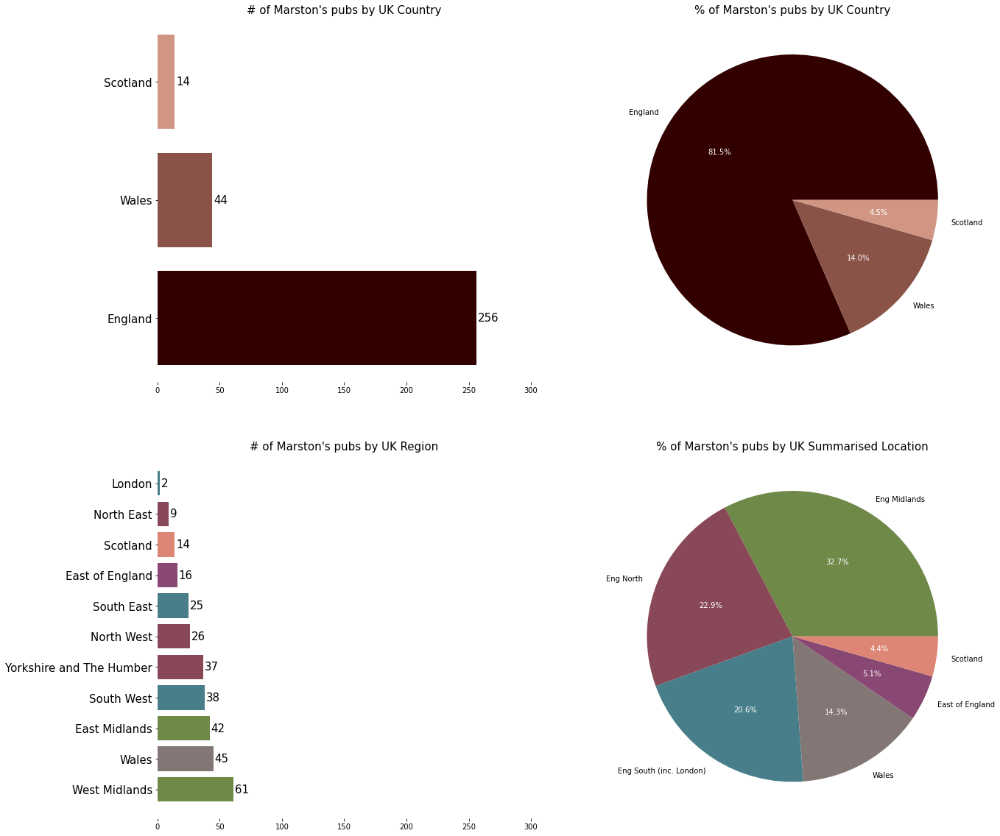

In [517]:
# Create new location column to summarise regions
completeDF['LocationSummary'] = ""
for index, row in completeDF.iterrows():
    if row['Region'] in ('South East', 'South West', 'London'):
        completeDF.at[index,'LocationSummary']="Eng South (inc. London)"
    elif row['Region'] in ('East Midlands', 'West Midlands'):
        completeDF.at[index,'LocationSummary']="Eng Midlands"
    elif row['Region'] in ('North East', 'North West', 'Yorkshire and The Humber'):
        completeDF.at[index,'LocationSummary']="Eng North"
    else:
        completeDF.at[index,'LocationSummary']=row['Region']
        

        
# Country/Region/Summarised Location Pivots        
df_pivot_country = createPivot(completeDF, 'PubName', 'StateName', pd.Series.nunique, False)
df_pivot_region = createPivot(completeDF, 'PubName', 'Region', pd.Series.nunique, False)
df_pivot_location = createPivot(completeDF, 'PubName', 'LocationSummary', pd.Series.nunique, False)



# Define subplots
f, [(ax0, ax1),
    (ax2, ax3)] = plt.subplots(2, 2, figsize=(20,20))

createHBar(ax0, df_pivot_country.index, df_pivot_country['PubName'], pie1, 0, 300, '# of Marston\'s pubs by UK Country', 15, 0)    
createPie(ax1, df_pivot_country['PubName'], "grey", '% of Marston\'s pubs by UK Country', 15, 'black', 'white', pie1)
createHBar(ax2, df_pivot_region.index, df_pivot_region['PubName'], regioncolour, 0, 300, '# of Marston\'s pubs by UK Region', 15, 0)    
createPie(ax3, df_pivot_location['PubName'], "grey", '% of Marston\'s pubs by UK Summarised Location', 15, 'black', 'white', locationcolour)
  
    
plt.show()
print('\n'*3)

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:white;font-family:newtimeroman;color:#682F2F;font-size:180%;text-align:center;border-radius:10px 10px;">Marston's UK Menu Analysis</p> 

In [518]:
productsPerPub = completeDF.shape[0] / completeDF['PubName'].nunique()
txt = "Across the "+ str(completeDF['PubName'].nunique()) + " pubs, there are a total of {:,} beverage products. This is an average of "+str(math.ceil(productsPerPub))+ " products per pub."
print(color.RED + color.BOLD +txt.format(completeDF.shape[0]))
print('\n')

Across the 314 pubs, there are a total of 114,691 beverage products. This is an average of 366 products per pub.




   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Unique Products</p>

In [519]:
df_pivot_uproducts = createPivot(completeDF, 'productName', ['category', 'subCategory', 'subSubCategory'], 
                                 pd.Series.nunique, False)
df_pivot_uproducts = df_pivot_uproducts.reset_index().rename_axis(None, axis=1)


totalprod = df_pivot_uproducts['productName'].sum()
totalcat = df_pivot_uproducts['category'].nunique()

txt = "There are {:,} unique beverage products in the dataset, split across {:,} categories."
print(color.RED + color.BOLD +txt.format(totalprod, totalcat))
print('\n'*2)

There are 1,713 unique beverage products in the dataset, split across 7 categories.





   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Unique Products - Draught (Pint)</p>

In [520]:
draughts = completeDF.loc[completeDF['category'] == 'Draught']
draughts2 = draughts.loc[draughts['subSubCategory'] == 'Pint']
displayPivot('Draughts', draughts2, ['category', 'subCategory'])

Draughts
                      productName
category subCategory             
Draught  Stout                  2
         Cider                 14
         Beers                 27
         Ales                  44


   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Unique Products - Spirits (Single measure)</p>

In [521]:
spirits = completeDF.loc[completeDF['category'] == 'Spirits']
spirits2 = spirits.loc[spirits['subSubCategory'] == 'Single']
displayPivot('Spirits', spirits2, ['category', 'subCategory'])

Spirits
                           productName
category subCategory                  
Spirits  Brandy                      4
         Fortified                   8
         Party Drinks               11
         Vodka                      14
         Rum                        15
         Shots & Bombs              19
         Whisky                     24
         Liqueurs & Shots           43
         Gin                        50


   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Unique Products - Bottles</p>

In [522]:
bottles = completeDF.loc[completeDF['category'] == 'Bottles']
displayPivot('Bottles', bottles, ['category', 'subCategory'])

Bottles
                           productName
category subCategory                  
Bottles  Alcopops                    9
         Low & No Alcohol           10
         Cider                      12
         Beers                      28
         Ales                       56


   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Unique Products - Wine (By the Glass)</p>

In [523]:
wines = completeDF.loc[completeDF['category'] == 'Wine']
wines2 = wines.loc[wines['subCategory'] == 'Wine by the Glass']
wines2['productName'] = wines2['productName'].str[:-5]

displayPivot('Wine', wines2, ['category', 'subSubCategory'])

Wine
                         productName
category subSubCategory             
Wine     Sparkling                 7
         Rose                     15
         White                    21
         Red                      22


   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Unique Products - Cocktails</p>

In [524]:
cocktails = completeDF.loc[completeDF['category'] == 'Cocktails']
displayPivot('Cocktails', cocktails, ['category', 'subCategory'])

Cocktails
                                productName
category  subCategory                      
Cocktails Fruit Refreshers                2
          Gin Twists                      4
          Pitchers                        5
          No Alcohol                      6
          Our Signature Serves            6
          Cocktails                      23


   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Unique Products - Hot Beverages</p>

In [525]:
hot = completeDF.loc[completeDF['category'] == 'Hot Beverages']
displayPivot('Hot Beverages', hot, ['category', 'subCategory'])

Hot Beverages
                             productName
category      subCategory               
Hot Beverages Hot Chocolate            1
              Extras                   4
              Tea                      7
              Coffee                   9


   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Unique Products - Soft Drinks</p>

In [526]:
soft = completeDF.loc[completeDF['category'] == 'Soft Drinks']
displayPivot('Soft Drinks', soft, ['category', 'subCategory'])

Soft Drinks
                               productName
category    subCategory                   
Soft Drinks Kids                        15
            Bottles & Cans              73
            Draught & Cordial           88


   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Unique Products - Average beverage prices by category</p>

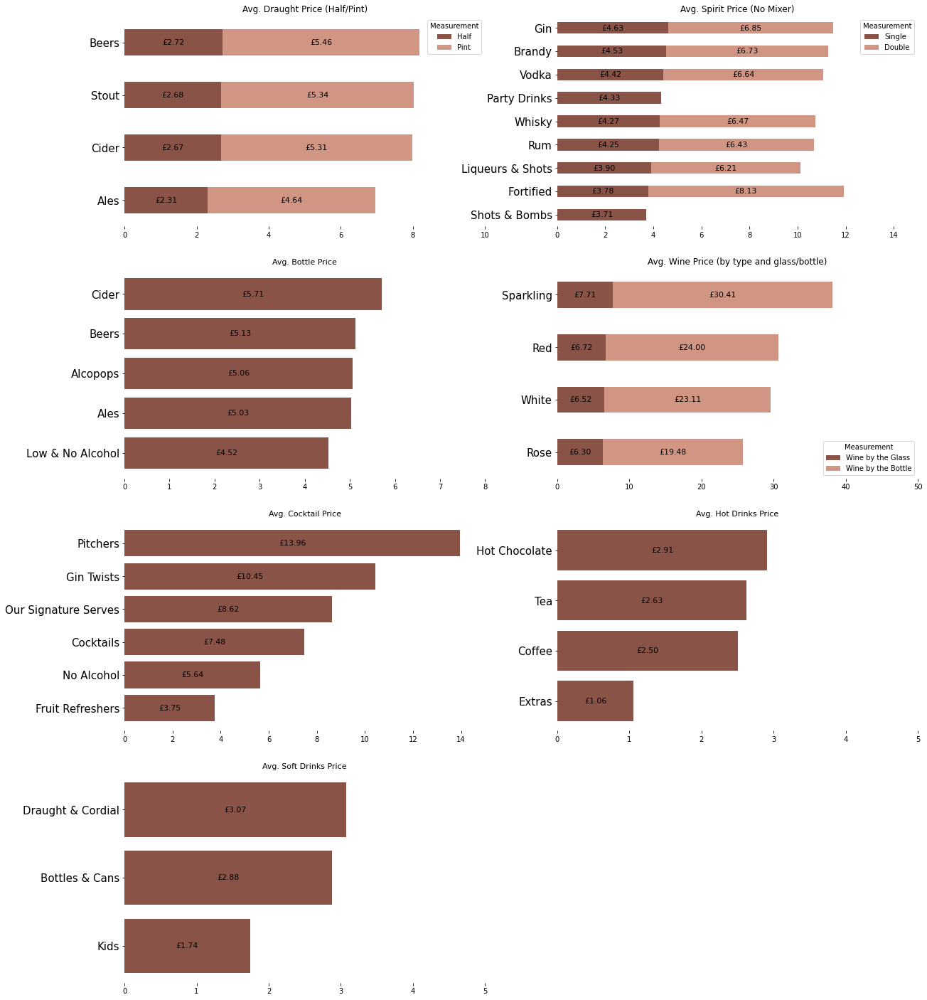

In [537]:
df_pivot_avgCost = createPivot2(completeDF, 'productPrice', ['category', 'subCategory', 'subSubCategory'], 
                                 [pd.Series.mean, np.std], False)
df_pivot_avgCost = df_pivot_avgCost.reset_index()
df_pivot_avgCost.columns = df_pivot_avgCost.columns.droplevel(1)

            
# Define subplots
f, [(ax0, ax1),
    (ax2, ax3),
    (ax4, ax5),
    (ax6, ax7)] = plt.subplots(4, 2, figsize=(20,25))


# AX0 - Draughts
df_pivot_avgCostDraughts = df_pivot_avgCost.loc[df_pivot_avgCost['category'] == 'Draught']
df_pivot_avgCostDraughts = df_pivot_avgCostDraughts.loc[df_pivot_avgCostDraughts['subSubCategory'].isin(['Half', 'Pint'])]
df_pivot_avgCostDraughts = df_pivot_avgCostDraughts[["subCategory", "subSubCategory", "mean"]]
df = df_pivot_avgCostDraughts.pivot("subCategory", "subSubCategory","mean")
df = df[['Half', 'Pint']].sort_values(by=['Half'], ascending=True)
createHbar2(ax0, df, True, [pie1[1], pie1[2]], "Avg. Draught Price (Half/Pint)", 0, 10, 'Measurement')


# AX1 - Spirits
df_pivot_avgCostSpirits = df_pivot_avgCost.loc[df_pivot_avgCost['category'] == 'Spirits']
df_pivot_avgCostSpirits = df_pivot_avgCostSpirits[["subCategory", "subSubCategory", "mean"]]
df = df_pivot_avgCostSpirits.pivot("subCategory", "subSubCategory","mean")
df = df[['Single', 'Double']].sort_values(by=['Single'], ascending=True)
createHbar2(ax1, df, True, [pie1[1], pie1[2]], "Avg. Spirit Price (No Mixer)", 0, 15.00, 'Measurement')   
     
        
# AX2 - Bottles
df_pivot_avgCostBottles = df_pivot_avgCost.loc[df_pivot_avgCost['category'] == 'Bottles']
df_pivot_avgCostBottles = df_pivot_avgCostBottles[["subCategory", "mean"]].sort_values(by=['mean'], ascending=True)
createHBar(ax2, df_pivot_avgCostBottles['subCategory'], df_pivot_avgCostBottles['mean'], [pie1[1]], 0, 8,
           "Avg. Bottle Price", 11, 1)
        
        
# AX3 - Wine
df_pivot_avgCostWine = df_pivot_avgCost.loc[df_pivot_avgCost['category'] == 'Wine']
df_pivot_avgCostWine = df_pivot_avgCostWine[["subSubCategory", "subCategory", "mean"]]
df = df_pivot_avgCostWine.pivot("subSubCategory", "subCategory", "mean")
df = df[['Wine by the Glass', 'Wine by the Bottle']].sort_values(by=['Wine by the Glass'], ascending=True)
createHbar2(ax3, df, True, [pie1[1], pie1[2]], "Avg. Wine Price (by type and glass/bottle)", 0, 50, 'Measurement')


# AX4 - Cocktails
df_pivot_avgCostCocktails = df_pivot_avgCost.loc[df_pivot_avgCost['category'] == 'Cocktails']
df_pivot_avgCostCocktails = df_pivot_avgCostCocktails[["subCategory", "mean"]].sort_values(by=['mean'], ascending=True)
createHBar(ax4, df_pivot_avgCostCocktails['subCategory'], df_pivot_avgCostCocktails['mean'], [pie1[1]], 0, 15,
           "Avg. Cocktail Price", 11, 1)
        

# AX5 - Hot Beverages
df_pivot_avgCostHot = df_pivot_avgCost.loc[df_pivot_avgCost['category'] == 'Hot Beverages']
df_pivot_avgCostHot = df_pivot_avgCostHot[["subCategory", "mean"]].sort_values(by=['mean'], ascending=True)
createHBar(ax5, df_pivot_avgCostHot['subCategory'], df_pivot_avgCostHot['mean'], [pie1[1]], 0, 5,
           "Avg. Hot Drinks Price", 11, 1)


# AX6 - Soft Drinks
df_pivot_avgCostSoft = df_pivot_avgCost.loc[df_pivot_avgCost['category'] == 'Soft Drinks']
df_pivot_avgCostSoft = df_pivot_avgCostSoft[["subCategory", "mean"]].sort_values(by=['mean'], ascending=True)
createHBar(ax6, df_pivot_avgCostSoft['subCategory'], df_pivot_avgCostSoft['mean'], [pie1[1]], 0, 5,
           "Avg. Soft Drinks Price", 11, 1)


       
ax7.set_visible(False)
plt.show()
print('\n'*2)

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:white;font-family:newtimeroman;color:#682F2F;font-size:180%;text-align:center;border-radius:10px 10px;">Geographic influence on beverage price</p> 


Occasional use of Python interactive pivot tables from here onwards, to save on coding overhead. Proceeding images are the results of my analysis.

In [528]:
# Create interactive pivot element, and save as html file for standalone use
from pivottablejs import pivot_ui
from IPython.display import HTML

pivot_ui(completeDF, outfile_path="CompleteDFPivot.html")

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Draught (Pint)</p>

<span style="color:red; font-weight:bold;">Red</span> indicates most expensive Region for Product Type.<br>
<span style="color:green; font-weight:bold;">Green</span> indicates least expensive Region for Product Type.<br>

<span style="color:#895348; font-weight:bold;"><u>Region</u></span>

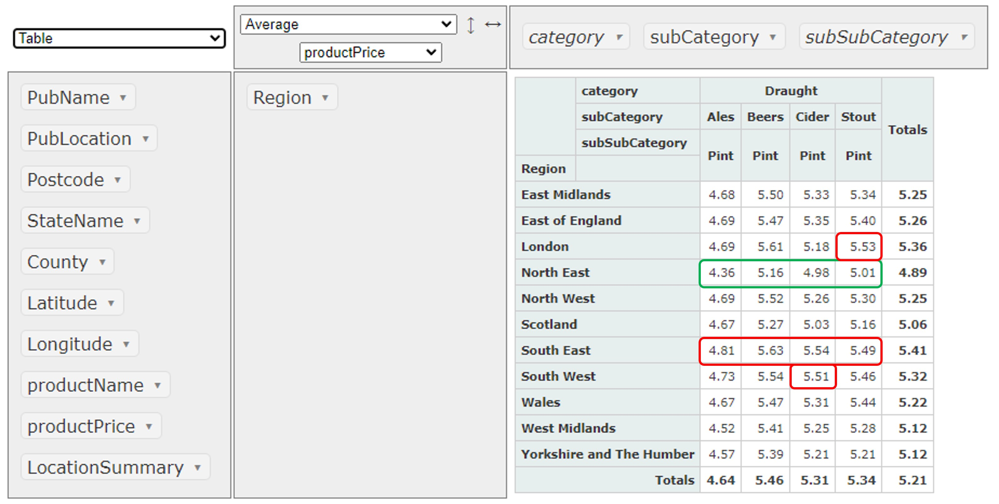

<span style="color:#895348; font-weight:bold;"><u>Sumarised Location</u></span>
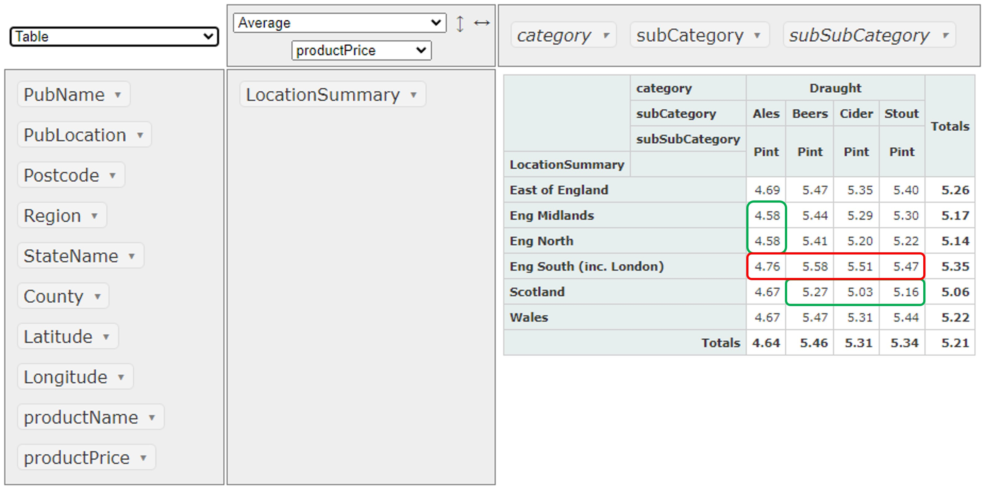

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Spirits (Single measure)</p>

<span style="color:#895348; font-weight:bold;"><u>Region</u></span>

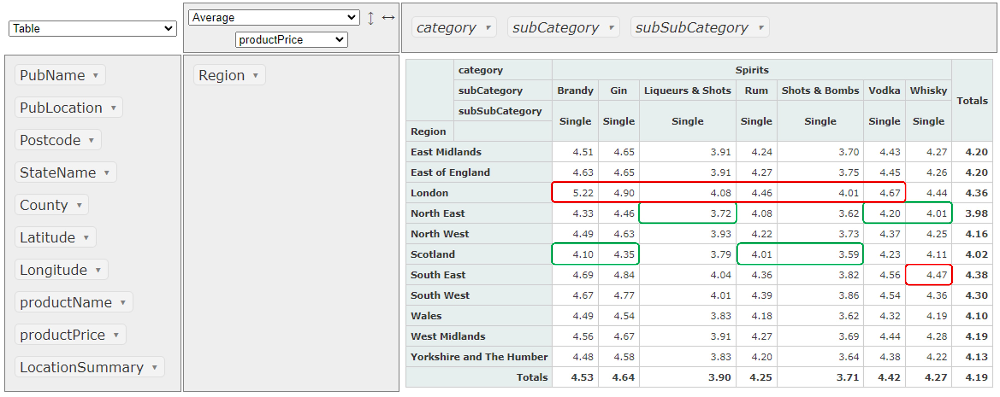

<span style="color:#895348; font-weight:bold;"><u>Sumarised Location</u></span>
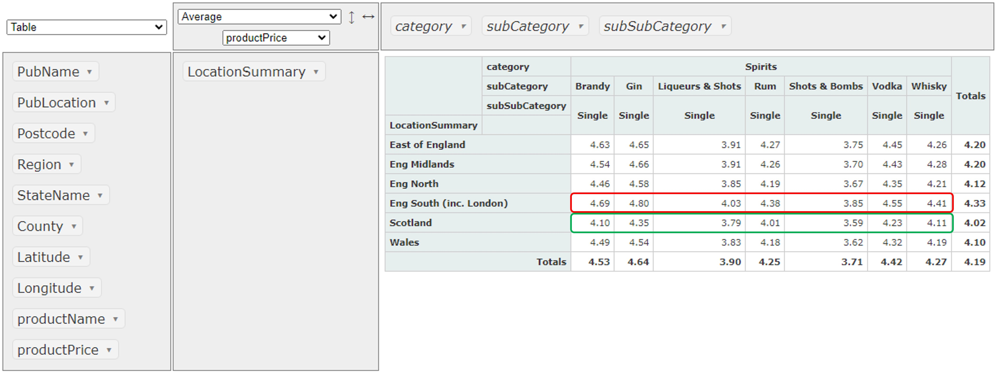

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Bottles (alcoholic)</p>

<span style="color:#895348; font-weight:bold;"><u>Region</u></span>

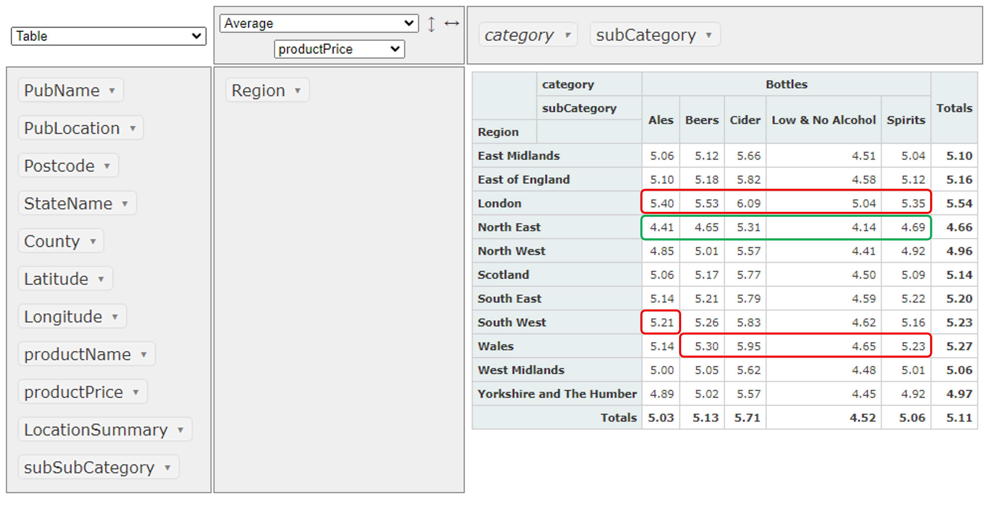

<span style="color:#895348; font-weight:bold;"><u>Sumarised Location</u></span>
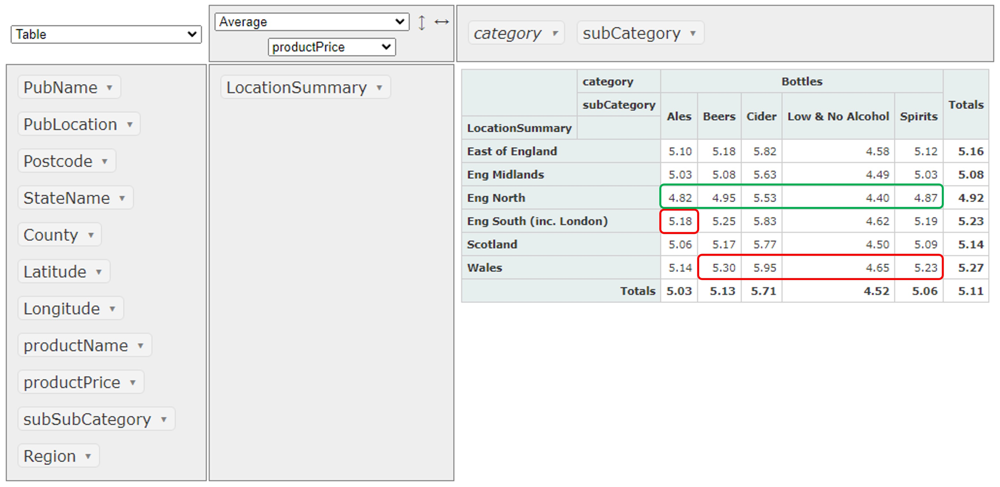

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Wine (Medium - 175ml glass)</p>

<span style="color:#895348; font-weight:bold;"><u>Region</u></span>

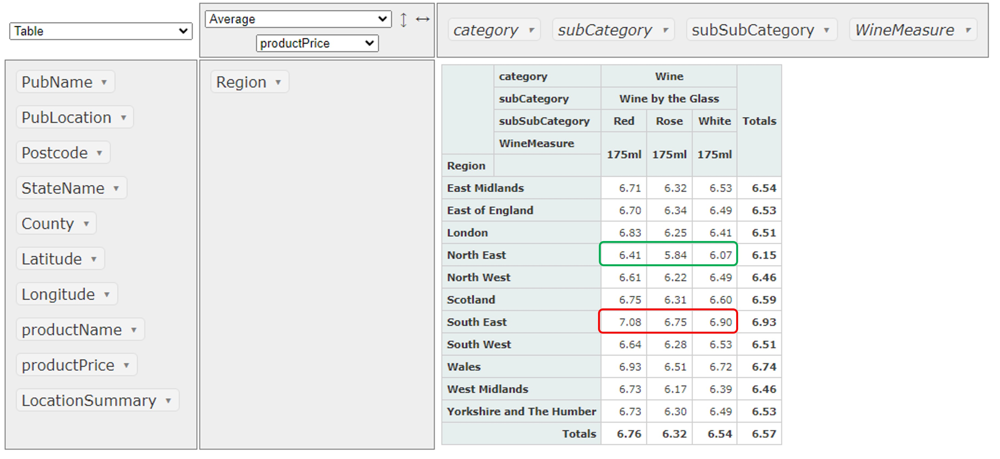

<span style="color:#895348; font-weight:bold;"><u>Sumarised Location</u></span>
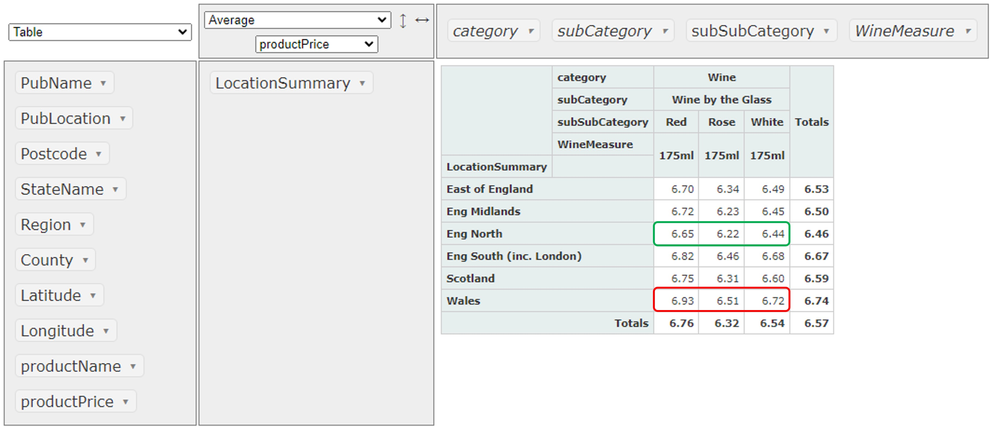

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Cocktails</p>

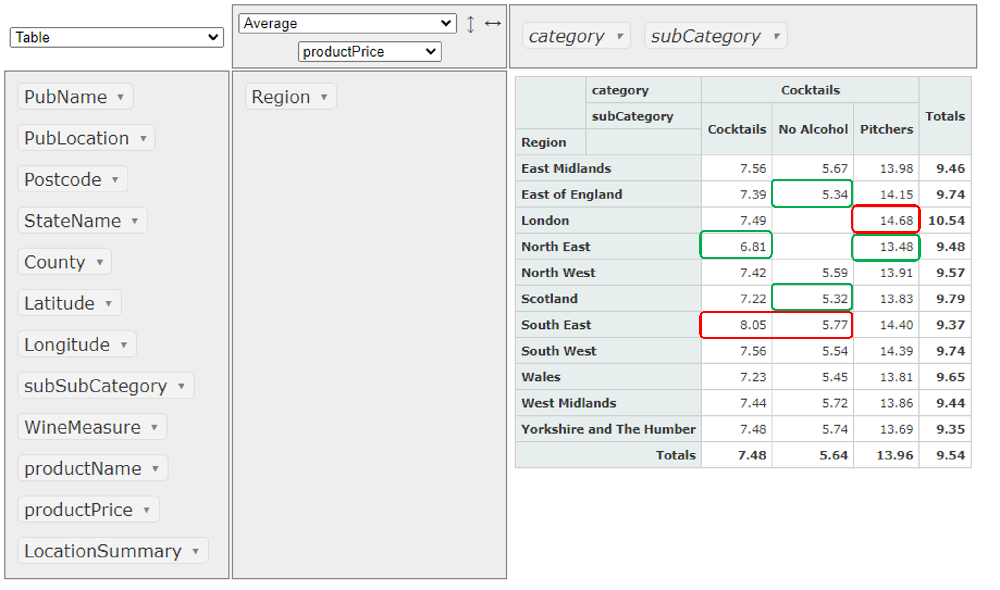

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Hot Beverages (excl. Extras)</p>

<span style="color:#895348; font-weight:bold;"><u>Region</u></span>

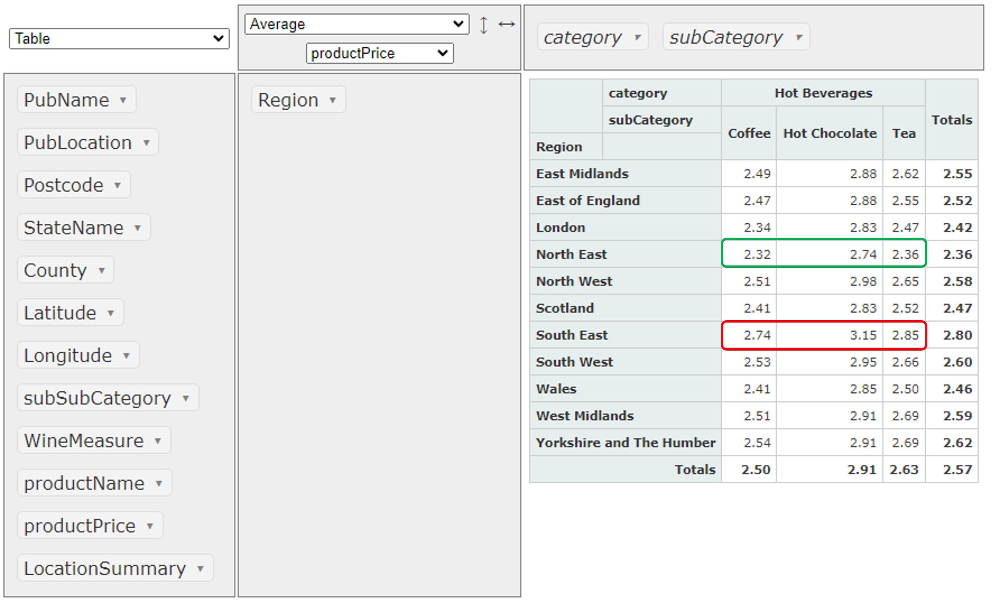

<span style="color:#895348; font-weight:bold;"><u>Sumarised Location</u></span>
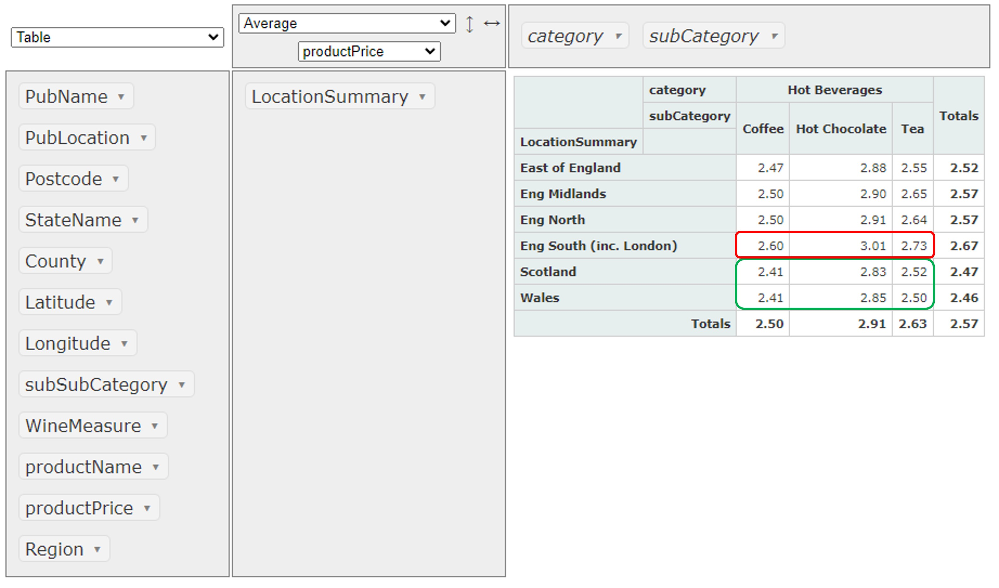

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Soft Drinks</p>

<span style="color:#895348; font-weight:bold;"><u>Region</u></span>

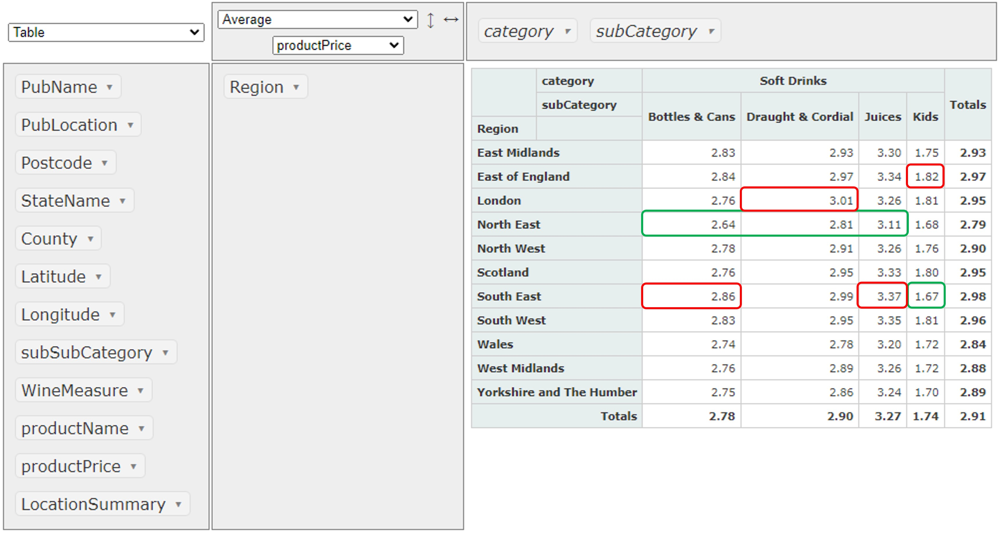

<span style="color:#895348; font-weight:bold;"><u>Sumarised Location</u></span>
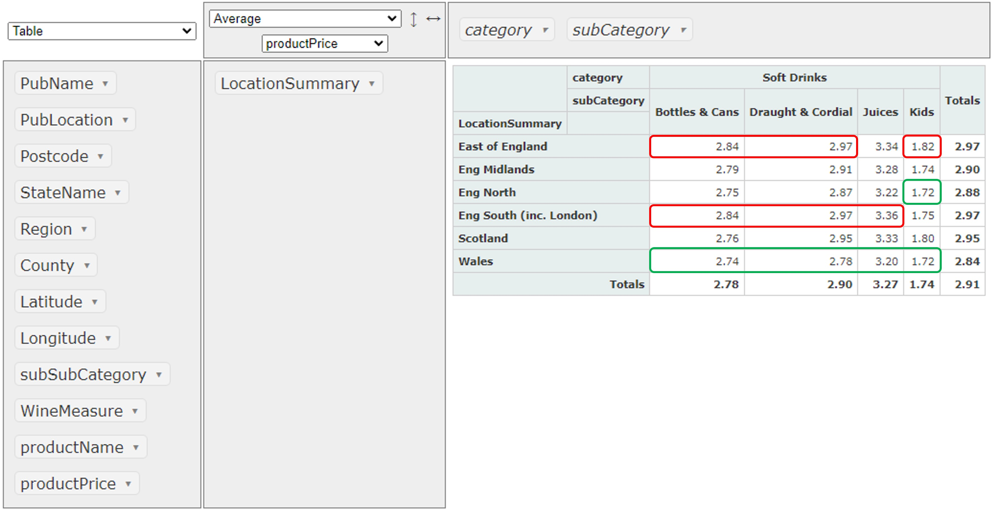

<br>
<br>
<br>

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:white;font-family:newtimeroman;color:#682F2F;font-size:180%;text-align:center;border-radius:10px 10px;">Premium Products</p> 

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Draughts (Pint only)</p>

In [529]:
draughtsTop10 = createPivot(draughts2, 'productPrice', ['category', 'subCategory', 'productName'],  pd.Series.mean, False)
outputPP(draughtsTop10)

Top 10 Most Expensive (on average)
                                                  productPrice
category subCategory productName                              
Draught  Beers       Erdinger Weissbier               6.630769
                     Neck Oil IPA                     6.490741
         Cider       Rosie Pig Rhubarb                6.200000
         Beers       Estrella Damm                    6.154167
                     Peroni                           6.122800
         Cider       Old Mout Berries & Cherries      6.030000
         Beers       Brooklyn Pilsner IPA             6.019231
                     Cruzcampo                        5.982394
                     Birra Moretti                    5.975625
         Cider       Old Mout Cherries                5.950000
----------------------------------------------------------------------------------------------------
Top 10 Least Expensive (on average)
                                            productPrice
category subCat

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Spirits (Single measure only)</p>

In [530]:
spiritsTop10 = createPivot(spirits2, 'productPrice', ['category', 'subCategory', 'productName'],  pd.Series.mean, False)
outputPP(spiritsTop10)

Top 10 Most Expensive (on average)
                                                      productPrice
category subCategory      productName                             
Spirits  Gin              Four Pillars Shiraz Gin         6.300000
                          Monkey 47                       6.233333
                          Warner London Dry Gin           6.207143
                          Warner Edwards Elderflower      5.900000
         Party Drinks     Patron Silver                   5.735000
         Gin              Malfy Rosa                      5.600000
         Liqueurs & Shots Patron Silver                   5.600000
         Gin              Chase Pink Grapefruit Gin       5.550000
         Vodka            Chase Vodka Rhubarb             5.520000
         Gin              Warner Edwards Rhubarb          5.437302
----------------------------------------------------------------------------------------------------
Top 10 Least Expensive (on average)
                        

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Bottles</p>

In [531]:
bottlesTop10 = createPivot(bottles, 'productPrice', ['category', 'subCategory', 'productName'],  pd.Series.mean, False)
outputPP(bottlesTop10)

Top 10 Most Expensive (on average)
                                                           productPrice
category subCategory productName                                       
Bottles  Beers       Erdinger Weissbier 500ml                  6.033333
         Ales        Founders All Day 355ml Bot                5.909375
         Cider       Old Mout Strawberry & Apple 500ml         5.841623
                     Old Mout Pineapple & Raspberry 500ml      5.816170
                     Old Mout Kiwi & Lime 500ml                5.809857
         Ales        Erdinger Weissbier 500ml                  5.809420
         Cider       Old Mout Watermelon & Lime 500ml          5.801653
                     Old Mout Berries & Cherries 500ml         5.798953
         Beers       Cobra 330ml                               5.798000
         Cider       Addlestones 500ml                         5.700000
----------------------------------------------------------------------------------------------------


   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Wine (By the Glass - 175ml)</p>

In [532]:
wines3 = wines2.loc[wines2['WineMeasure'] == '175ml']
winesTop10 = createPivot(wines3, 'productPrice', ['category', 'subCategory', 'productName'],  pd.Series.mean, False)
outputPP(winesTop10)

Top 10 Most Expensive (on average)
                                                             productPrice
category subCategory       productName                                   
Wine     Wine by the Glass Stellenbosch Pinotage                11.916667
                           Andeluna Malbec                      11.607143
                           Saint Clair Sauvignon Blanc          11.583333
                           Old Vines Zinfandel Maggio Lodi      11.333333
                           Time Waits For No One                11.083333
                           Mirabeau Forever Summer Rosé         10.750000
                           Sachetto Pinot Grigio                 8.875000
                           Quasar Rioja                          8.857143
                           Alta Vista Malbec                     8.838889
                           Domaine Les Petits                    8.833333
-----------------------------------------------------------------------------

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Cocktails</p>

In [533]:
cocktailsTop10 = createPivot(cocktails, 'productPrice', ['category', 'subCategory', 'productName'],  pd.Series.mean, False)
outputPP(cocktailsTop10)

Top 10 Most Expensive (on average)
                                                   productPrice
category  subCategory productName                              
Cocktails Pitchers    Godfather Pitcher               14.532172
                      Purple Rain Pitcher             14.529730
                      Woo Woo Pitcher                 13.545946
                      Sex On The Beach Pitcher        13.531250
                      Long Island Ice Tea Pitcher     13.522135
          Gin Twists  Just Peachy                     10.750000
                      Bramble Amble                   10.500000
                      Kiss From A Rose                10.250000
                      Sicilian Sunset                 10.250000
          Cocktails   Negroni                          9.250000
----------------------------------------------------------------------------------------------------
Top 10 Least Expensive (on average)
                                                         pro

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Hot Beverages</p>

In [534]:
hotTop10 = createPivot(hot, 'productPrice', ['category', 'subCategory', 'productName'],  pd.Series.mean, False)
outputPP(hotTop10)

Top 10 Most Expensive (on average)
                                                  productPrice
category      subCategory   productName                       
Hot Beverages Hot Chocolate Hot Chocolate             2.913191
              Extras        Mocha                     2.880297
              Coffee        Latte                     2.853626
                            Flat White                2.851538
                            Cappuccino                2.849053
              Tea           Moroccan Mint Tea         2.710625
                            Tea Decaff Earl Grey      2.702778
                            Green Tea                 2.696264
                            Earl Grey Tea             2.693827
              Coffee        Floater Coffee            2.692560
----------------------------------------------------------------------------------------------------
Top 10 Least Expensive (on average)
                                                 productPrice
category  

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Soft Drinks</p>

In [535]:
softTop10 = createPivot(soft, 'productPrice', ['category', 'subCategory', 'productName'],  pd.Series.mean, False)
outputPP(softTop10)

Top 10 Most Expensive (on average)
                                                                  productPrice
category    subCategory       productName                                     
Soft Drinks Draught & Cordial Apple Juice - Pint                      4.317179
                              Cranberry Juice - Pint                  4.316157
                              Orange Juice - Pint                     4.290102
                              Eager Apple Juice Pint                  4.197619
                              Eager Orange Juice Pint                 4.187500
                              Eager Apple Juice & Lemonade Pint       4.167582
                              Eager Orange Juice & Lemonade Pint      4.166471
                              Eager Pineapple Juice Pint              4.142287
                              Pineapple Juice & Lemonade Pint         4.134677
            Bottles & Cans    Belu Sparkling Mineral Water 750ml      4.133333
-----------------

   <a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Save final dataset</p>

In [536]:
completeDF.to_excel("CompleteDataset-V2.xlsx")